<a href="https://colab.research.google.com/github/Ikeda33/codespaces-railstutorial/blob/main/vit_withse_equalityloss_in__Gloss_75epoch__256ch_flower_D_v_G_sa_FID_KID_devide_1_color_relativistic1_hinge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#パッケージのダウンロード


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import argparse

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim

In [5]:
import torchvision.transforms as transforms

In [6]:
import torchvision.datasets as dset

In [7]:
import torchvision.utils as vutils

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import tqdm

In [9]:
import glob

In [10]:
from torch.utils.data import Dataset
from PIL import Image

In [11]:
from torch.utils.data import DataLoader
import torchvision

In [12]:
!pip install torchmetrics
!pip install torchmetrics[image]

!pip install torch-fidelity

from torchmetrics.image.inception import InceptionScore


import torchmetrics
import torch_fidelity

import torch
_ = torch.manual_seed(123)
from torchmetrics.image.fid import FrechetInceptionDistance
fid = FrechetInceptionDistance(feature=2048)

from torchmetrics.image.kid import KernelInceptionDistance


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 5.0 MB/s eta 0:00:00


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:06<00:00, 15.4MB/s]


In [13]:
kid = KernelInceptionDistance(subset_size=15)

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


In [14]:
#ハイパーパラメータの設定

In [15]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epoch", type = int, default= 75)
parser.add_argument("--batch_size", type = int, default=32)
parser.add_argument("--lr_g", type = float, default=2e-4)
parser.add_argument("--lr_d", type = float, default=3e-4)
parser.add_argument("--nch_g", type = int, default=256)
parser.add_argument("--nch_d", type = int, default=256)
parser.add_argument("--z_dim", type = int, default=100)
parser.add_argument("--beta1", type = float, default=0.5)

opt = parser.parse_args(args=[])
print(opt)

Namespace(n_epoch=75, batch_size=32, lr_g=0.0002, lr_d=0.0003, nch_g=256, nch_d=256, z_dim=100, beta1=0.5)


In [16]:
class ImageDataset(Dataset):
    def __init__(self,  transform = None):
        super().__init__()
        self.file_list = glob.glob("/content/drive/MyDrive/102flowers (2)/jpg/*.jpg")#private acounts /content/drive/MyDrive/102flowers (2).tar
        #self.file_list = glob.glob("/content/drive/MyDrive/102flowers (2)/jpg/*.jpg")#/content/drive/MyDrive/img_align_celeba.zip
        #self.file_list = glob.glob("/content/drive/MyDrive/cityscapes/cityscapes_data/train/*.jpg" )#/content/drive/MyDrive/cityscapes/cityscapes_data/train
        #self.file_list = glob.glob("/content/drive/MyDrive/Test/**/*.jpg" )#fruits
       # self.file_list = glob.glob("/content/drive/MyDrive/img_align_celeba.zip/jpg/*.jpg")#C:\Users\ikeda\Downloads\img_align_celeba\img_align_celeba
        #self.file_list = glob.glob("/content/drive/MyDrive/–¢Šm”F 758452(1).crdownload/*.jpg")
        self.transform = transform


    def __getitem__(self, index):
        if self.transform is not None:
            img = self.transform(Image.open(self.file_list[index]))
        else:
            img = Image.open(self.file_list[index])
        return img

    def __len__(self):
        return len(self.file_list)

In [17]:
from torchvision.transforms.transforms import CenterCrop

transform = transforms.Compose([

    transforms.Resize(80),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
                               transforms.Normalize((0.5,),(0.5,))])

In [18]:
#dataset = dset.MNIST("./", train = True, download = True,transform = transform)
dataset = ImageDataset(transform = transform)
#dataset = torchvision.datasets.CelebA("./", split = "test", download = True,transform = transform) #Cityscapes
#dataset = torchvision.datasets.Cityscapes("C:\Users\ikeda\Downloads\cityscapes\cityscapes_data\cityscapes_data", split='train', mode='fine', target_type='color')


In [19]:
dataloader = DataLoader(dataset = dataset, batch_size = opt.batch_size,num_workers = 2,  shuffle = True)

In [20]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [21]:
#モデルの設定

In [22]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [23]:
class ResidualBlock_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE_G(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [24]:
class ResidualBlock_1(nn.Module):#実質パディングとスペクトラム正規化とインスタンス正規化
  def __init__(self, in_channels):
    super().__init__()
    self.conv_layers = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),
        nn.ReLU(inplace = True),

        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),

    )
  def forward(self, x):
    out = self.conv_layers(x)
    out = out + x
    return out

In [25]:
class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        #out_channels = in_channels // n_divide
        out_channels = 1

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [26]:
#import torch
#from layers.transformer.ScaledDotProductAttention import ScaledDotProductAttention
#from torch import nn


class MultiHeadAttention(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.Conv2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)

        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out


In [27]:

class MultiHeadAttention_G(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE_G(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        qkv = self.relu(qkv)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)
        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out

In [28]:
class SelfAttention_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        out_channels = in_channels // n_divide
      #  out_channels = 1

        self.fx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.gx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [29]:
class PF(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) -x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x= self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [30]:
"""    def __init__(self, in_channels):
        super().__init__()
        n_divide = 8
        out_channels = in_channels // n_divide
        self.dim = 3

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool= nn.AvgPool2d(kernel_size =self.dim , stride = 1, padding = 0, count_include_pad=False)
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        B, C, H, W = x.size()
        z = self.pre_bn(x)
        z = self.pool(z, self.dim = H)

        z = self.conv1(z)
        z = self.relu(z)

        z = self.conv2(z)
        z = self.sigmoid(z)

        z = torch.einsum("bchw,bchw->bchw",(x, z))
        out = x + self.gamma * z
        return out
"""

'    def __init__(self, in_channels):\n        super().__init__()\n        n_divide = 8\n        out_channels = in_channels // n_divide\n        self.dim = 3\n\n        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm\n        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#\n        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#\n        self.gamma = nn.Parameter(torch.zeros(1))\n        self.softmax = nn.Softmax(dim = -2)#規格化するため -2\n        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1\n        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))\n        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること\n        self.pre_bn = nn.BatchNorm2d(in_channels)\n        self.bn = n

In [31]:
class SE(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
           # nn.Linear(channel, channel// reduction , bias=False),
            (nn.Conv2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            (nn.Conv2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        #y = self.avg_pool(x).view(b, c)
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)




In [32]:
class SE_G(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            #nn.Linear(channel, channel// reduction , bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [33]:
#nn.ConvTranspose2d
class PF_G(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) - x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x = self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [34]:
"""(((W - K + 2P)/S) + 1)
    Here W = Input size
    K = Filter size
    S = Stride
    P = Padding
    ((Input_size-kernel_size + 2*Padding)/stride)+ 1
    この式を使用できます[(W−K+2P)/S]+1。

W は入力ボリュームです - あなたの場合は 128
Kはカーネルサイズです - あなたの場合は5です
P はパディングです - あなたの場合は 0 だと思います
S はストライドです - あなたが提供していません。
したがって、次の式に入力します。
for example
Output_Shape = (128-5+0)/1+1

Output_Shape = (124,124,40)
output==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W
    """



'(((W - K + 2P)/S) + 1)\n    Here W = Input size\n    K = Filter size\n    S = Stride\n    P = Padding\n    ((Input_size-kernel_size + 2*Padding)/stride)+ 1\n    この式を使用できます[(W−K+2P)/S]+1。\n\nW は入力ボリュームです - あなたの場合は 128\nKはカーネルサイズです - あなたの場合は5です\nP はパディングです - あなたの場合は 0 だと思います\nS はストライドです - あなたが提供していません。\nしたがって、次の式に入力します。\nfor example\nOutput_Shape = (128-5+0)/1+1\n\nOutput_Shape = (124,124,40)\noutput==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W\n    '

In [35]:
class VIT(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size = 3, stride = 1, padding = 3//2)
        self.attention = SelfAttention(in_channels)
        self.se_block_0 = SE(in_channels)
        self.se_block_1 = SE(out_channels)

        self.flat = nn.Flatten()

        self.linear_1 = nn.Linear(32,64, bias=False)
        self.linear_2 = nn.Linear( 32,32, bias=False)#if ( 64,32, bias=False)  -> mat1 and mat2 shapes cannot be multiplied (131072x32 and 64x32)


    def shortcut(self, x):
        x = self.conv3(x)
        #x = self.se_block_1(x)
        x = self.bn(x)
        return x

    def forward(self, x):

        identity = x#入力
        x = self.pre_bn(x)
        x = self.se_block_0(x)
       # x = self.attention(x) - x
        x = x + identity


        identity = x#入力
        x = self.pre_bn(x)
       # b, c, h, w = x.size()
        x = self.conv1(x)


      #  x = self.linear_1(x).view(b, -1, h, w)
        x = self.relu(x)
       # x = self.linear_2(x).view(b, -1, h, w)


        x =  self.shortcut(identity) + x
        #x = x + self.shortcut(identity)
        x = self.bn(x)

        return x

In [36]:
#nn.ConvTranspose2d
class VIT_G(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size=1 -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.attention = MultiHeadAttention_G(in_channels)

    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.attention(x) - x
        x = x + identity

        #identity = x#入力
        x = self.pre_bn(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [37]:
class Generator(nn.Module):
    def __init__(self,pf, vit, resnet,res_net,sa,z_dim = opt.z_dim, ngf = opt.nch_g, nc = 3):# ものくろだからnc=1 カラーならnc=3
        super().__init__()

        self.convt1 = self.conv_trans_layers(z_dim, 8*ngf, 4,1,0 )# ngf = the number of channels

        self.convt2 = self.conv_trans_layers(8*ngf, 4*ngf, 4, 2, 1 )
        self.convt3 = self.conv_trans_layers(4*ngf,  2*ngf, 4,2,1)
        self.convt4 = self.conv_trans_layers(2*ngf,  ngf, 4,2,1 )

        self.pf1 = pf(z_dim, 8*ngf)
        self.vit1 = vit(z_dim, 8*ngf)

        self.pf2 = pf(8*ngf, 4*ngf)
        self.vit2 = vit(8*ngf, 4*ngf)

        self.pf3 = pf(4*ngf,  2*ngf)
        self.vit3 = vit(4*ngf,  2*ngf)

        self.pf4 = pf(2*ngf,  ngf)
        self.vit4 = vit(2*ngf,  ngf)

        self.convt5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
            #self.conv_trans_layers(ngf, nc, 4,2,1  )
            nn.Tanh()
        )


    @staticmethod
    def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm=True,attention=True, res_net= False, se = False):
        layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]#spectralnorm
        if has_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        #layers.append(nn.ReLU(inplace = True))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE_G(out_channels))
        if attention:
            layers.append(SelfAttention_G(out_channels))
        if res_net:
            layers.append(ResidualBlock_G(out_channels))



        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.convt1(x)

        out = self.convt2(out)

        out = self.convt3(out)

        out = self.convt4(out)

        out = self.convt5(out)


        return out

In [38]:
from pickle import FALSE
class Discriminator(nn.Module):
    def __init__(self,pf,vit ,resnet,res_net,sa,nc = 3, ndf = opt.nch_d):# ものくろだからnc=1 カラーならnc=3
        super().__init__()
        self.conv1 = self.conv_layers(nc, ndf)
        self.pf1 = pf(nc,ndf)
        self.vit1 = vit(nc,ndf)

        self.conv2 = self.conv_layers(ndf, 2*ndf )
        self.pf2 = pf(ndf, 2*ndf)
        self.vit2 = vit(ndf, 2*ndf)

        self.conv3 = self.conv_layers(2*ndf, 4*ndf )
        self.pf3 = pf(2*ndf, 4*ndf )
        self.vit3 = vit(2*ndf, 4*ndf )

        self.conv4 = self.conv_layers(4*ndf, 8*ndf)
        self.pf4 = pf(4*ndf, 8*ndf)
        self.vit4 = vit(4*ndf, 8*ndf)

        self.vit5 = vit(8*ndf, 16*ndf)

        self.conv5 =  nn.Conv2d(8*ndf, 1,  4)
        #self.conv6 =  nn.Conv2d(16*ndf, 1,  4)


    @staticmethod
    def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, has_batch_norm = True, attention = False, res_net = False, se = False):
        layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
        if has_batch_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE(out_channels))
        if attention:
            layers.append(SelfAttention(out_channels))

        if res_net:
            layers.append(ResidualBlock(out_channels))


        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.conv1(x)

        out = self.vit2(out)

        out = self.vit3(out)

        out = self.vit4(out)

        out = self.conv5(out)

        return out

In [39]:
#モデルのトレーニング

In [40]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [41]:
device

device(type='cuda')

In [42]:
netG = Generator(PF_G,VIT_G,ResidualBlock,ResidualBlock_1,SelfAttention, z_dim=opt.z_dim , ngf=opt.nch_g ).to(device)
netG.apply(weights_init)
print(netG)

netD = Discriminator(PF,VIT,ResidualBlock,ResidualBlock_1,SelfAttention, nc = 3 , ndf=opt.nch_d ).to(device)# ものくろだからnc=1 カラーならnc=3
netD.apply(weights_init)
print(netD)

Generator(
  (convt1): Sequential(
    (0): ConvTranspose2d(100, 2048, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(2048, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(2048, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspose2d(2048, 2048, kernel_size=(1, 1), stride=(1, 1))
      (softmax): Softmax(dim=-2)
    )
  )
  (convt2): Sequential(
    (0): ConvTranspose2d(2048, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(1024, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(1024, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): 

In [43]:
#criterion = nn.BCELoss()
#criterion = torch.nn.HingeEmbeddingLoss()
optimizerG = optim.Adam(netG.parameters(), lr = opt.lr_g, betas= (opt.beta1, 0.999), weight_decay = 1e-5)
optimizerD = optim.Adam(netD.parameters(), lr = opt.lr_d, betas= (opt.beta1, 0.999), weight_decay = 1e-5)

In [44]:
def reverse_relu(x):
    return torch.where(x <= 0, x, torch.zeros_like(x))

100%|██████████| 103/103 [00:33<00:00,  3.10it/s]


epoch: 0, lossD:0.6940796974937893, lossG:6.127893859900317,lossG_fake:3.0639469334222738, lossG_real:2.746452466087434 ,equality:0.31749446733483966


evaluate:110.42574310302734,kid_mean:0.07493218779563904, kid_std:0.04466831311583519,kid_:(tensor(0.0749), tensor(0.0447))


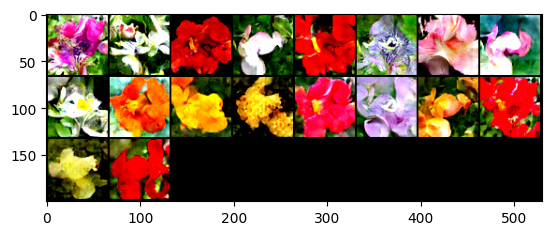

100%|██████████| 103/103 [00:33<00:00,  3.10it/s]


epoch: 1, lossD:0.6854029240683445, lossG:6.192737903409792,lossG_fake:3.0963689337656337, lossG_real:2.790942327345459 ,equality:0.3054266064201747


evaluate:110.27384185791016,kid_mean:0.07506289333105087, kid_std:0.038787901401519775,kid_:(tensor(0.0751), tensor(0.0388))


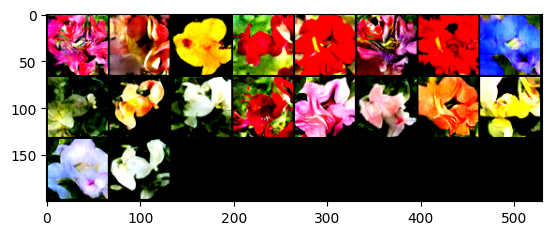

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 2, lossD:0.6109271863638197, lossG:6.282431961263268,lossG_fake:3.1412159823676915, lossG_real:2.8433015413075973 ,equality:0.29791444106009424


evaluate:111.18948364257812,kid_mean:0.07198821008205414, kid_std:0.036352481693029404,kid_:(tensor(0.0720), tensor(0.0364))


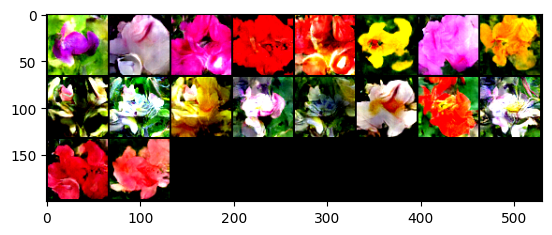

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 3, lossD:0.6763390367760241, lossG:6.164011471479842,lossG_fake:3.0820057198260593, lossG_real:2.7563782658391784 ,equality:0.32562745398688087


evaluate:111.00489807128906,kid_mean:0.07485175877809525, kid_std:0.035824235528707504,kid_:(tensor(0.0749), tensor(0.0358))


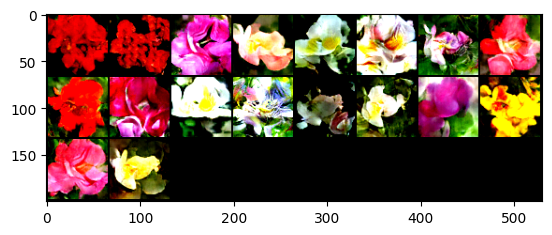

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 4, lossD:0.6900291991175957, lossG:6.323281170095055,lossG_fake:3.1616405866389137, lossG_real:2.7991292543202926 ,equality:0.3625113323186211


evaluate:111.11042022705078,kid_mean:0.08029972016811371, kid_std:0.040178921073675156,kid_:(tensor(0.0803), tensor(0.0402))


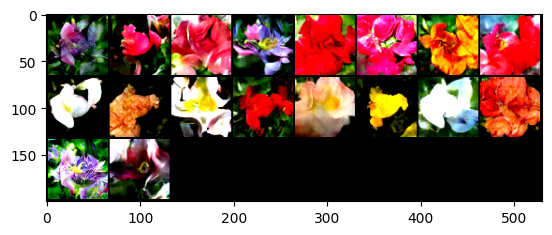

100%|██████████| 103/103 [00:33<00:00,  3.10it/s]


epoch: 5, lossD:0.7106795637208281, lossG:6.083110348692218,lossG_fake:3.041555184762455, lossG_real:2.8164152279857873 ,equality:0.22513995677666765


evaluate:111.11885070800781,kid_mean:0.07977936416864395, kid_std:0.049820590764284134,kid_:(tensor(0.0798), tensor(0.0498))


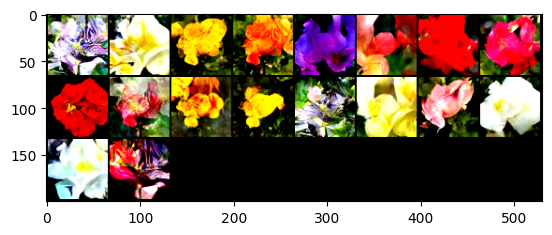

100%|██████████| 103/103 [00:33<00:00,  3.10it/s]


epoch: 6, lossD:0.6379103275034034, lossG:6.331142691732611,lossG_fake:3.165571347747034, lossG_real:2.8864333615141007 ,equality:0.2791379862329335


evaluate:111.3119125366211,kid_mean:0.07093748450279236, kid_std:0.036691103130578995,kid_:(tensor(0.0709), tensor(0.0367))


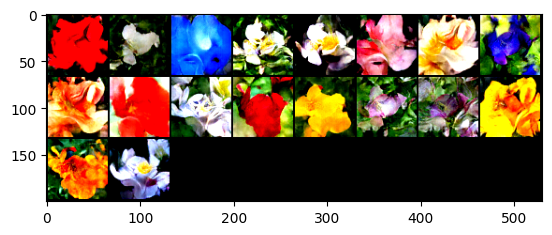

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 7, lossD:0.6111551032229824, lossG:6.256596639318373,lossG_fake:3.128298314740357, lossG_real:2.8661122105798675 ,equality:0.2621861041604894


evaluate:110.82350158691406,kid_mean:0.08312290161848068, kid_std:0.03977194055914879,kid_:(tensor(0.0831), tensor(0.0398))


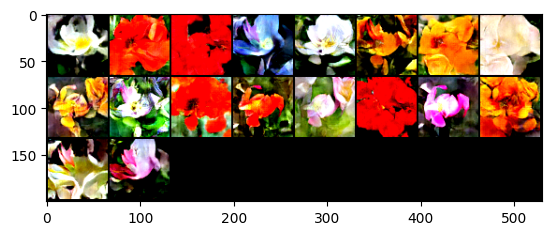

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 8, lossD:0.6179231816486827, lossG:6.463170266845851,lossG_fake:3.231585141524528, lossG_real:2.9295637601787603 ,equality:0.3020213813457677


evaluate:110.37725830078125,kid_mean:0.07230627536773682, kid_std:0.03789066523313522,kid_:(tensor(0.0723), tensor(0.0379))


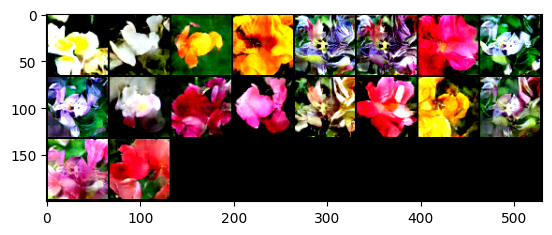

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 9, lossD:0.5606507961321803, lossG:6.256201130672566,lossG_fake:3.1281005670723405, lossG_real:2.95887338738997 ,equality:0.16922717968237055


evaluate:110.1480712890625,kid_mean:0.07334627211093903, kid_std:0.041834812611341476,kid_:(tensor(0.0733), tensor(0.0418))


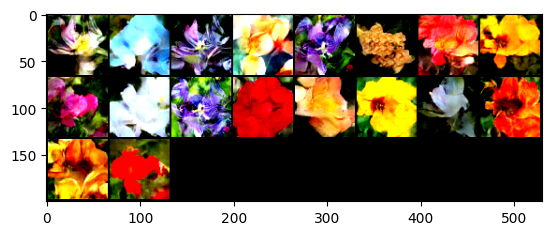

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 10, lossD:0.5316374608252233, lossG:6.46354901211933,lossG_fake:3.2317745144506103, lossG_real:3.029226388456752 ,equality:0.20254812599385819


evaluate:110.371337890625,kid_mean:0.07796105742454529, kid_std:0.042299699038267136,kid_:(tensor(0.0780), tensor(0.0423))


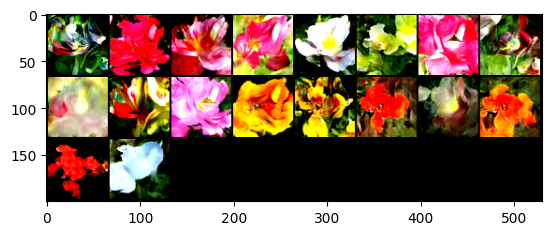

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 11, lossD:0.5584205839855289, lossG:6.211172696456169,lossG_fake:3.105586349964142, lossG_real:2.9822635558045025 ,equality:0.12332279415963932


evaluate:110.02592468261719,kid_mean:0.08140648901462555, kid_std:0.04266861081123352,kid_:(tensor(0.0814), tensor(0.0427))


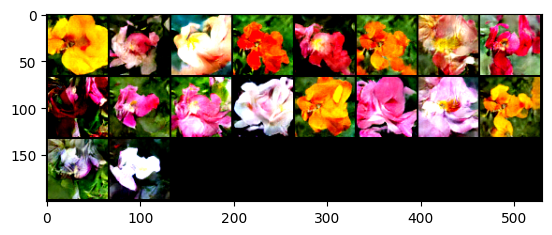

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 12, lossD:0.614362773964706, lossG:6.347093480304607,lossG_fake:3.1735467366801884, lossG_real:2.9395453350491896 ,equality:0.2340014016309988


evaluate:109.87323760986328,kid_mean:0.07121746242046356, kid_std:0.04150471091270447,kid_:(tensor(0.0712), tensor(0.0415))


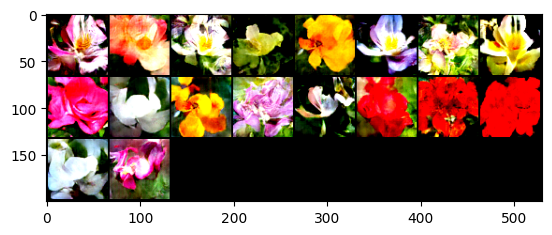

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 13, lossD:0.5671571480490051, lossG:6.432878998876776,lossG_fake:3.2164394930728433, lossG_real:2.9487158240913187 ,equality:0.26772366898152455


evaluate:109.2729263305664,kid_mean:0.07237674295902252, kid_std:0.04225653409957886,kid_:(tensor(0.0724), tensor(0.0423))


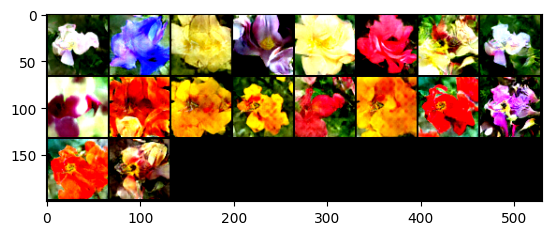

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 14, lossD:0.5516609843928837, lossG:6.472459744481207,lossG_fake:3.2362298725299463, lossG_real:2.967984522719985 ,equality:0.2682453498099613


evaluate:109.0593490600586,kid_mean:0.07612714171409607, kid_std:0.043531619012355804,kid_:(tensor(0.0761), tensor(0.0435))


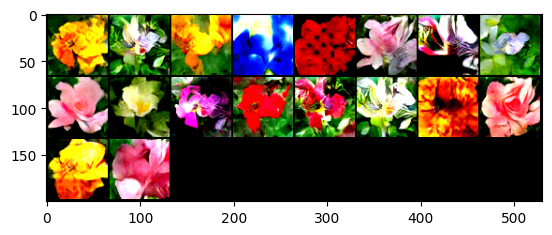

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 15, lossD:0.5955028974821845, lossG:6.375354989061078,lossG_fake:3.1876774875863085, lossG_real:3.0092040968751443 ,equality:0.1784733907111642


evaluate:108.91177368164062,kid_mean:0.07232004404067993, kid_std:0.044794753193855286,kid_:(tensor(0.0723), tensor(0.0448))


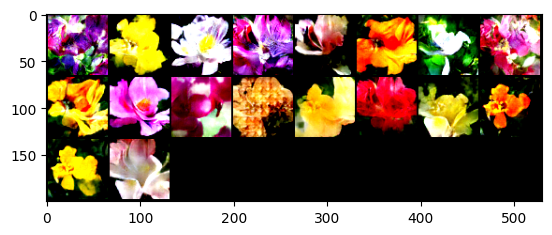

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 16, lossD:0.6090786695408011, lossG:6.3255648728713245,lossG_fake:3.1627824381717202, lossG_real:2.9871300395252636 ,equality:0.17565239864645665


evaluate:108.71023559570312,kid_mean:0.07738279551267624, kid_std:0.04656796157360077,kid_:(tensor(0.0774), tensor(0.0466))


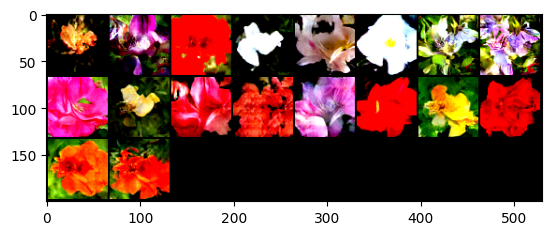

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 17, lossD:0.5861801396946884, lossG:6.635823657211748,lossG_fake:3.317911818189528, lossG_real:3.0949590751557676 ,equality:0.22295274303376056


evaluate:108.02735900878906,kid_mean:0.07024454325437546, kid_std:0.037353284657001495,kid_:(tensor(0.0702), tensor(0.0374))


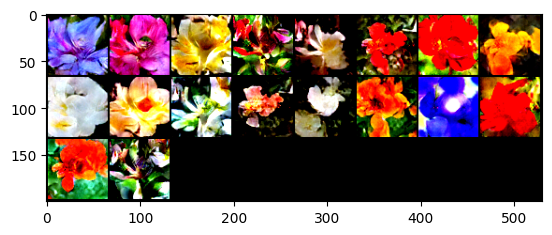

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 18, lossD:0.47530498370094204, lossG:6.546140629110984,lossG_fake:3.273070302403089, lossG_real:3.031100479578509 ,equality:0.24196982282458013


evaluate:108.34040069580078,kid_mean:0.06964148581027985, kid_std:0.04050704464316368,kid_:(tensor(0.0696), tensor(0.0405))


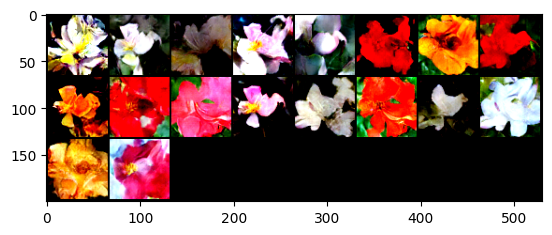

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 19, lossD:0.5022468847918857, lossG:6.444083216120895,lossG_fake:3.2220416152216855, lossG_real:3.0258725849748815 ,equality:0.196169030246804


evaluate:108.54585266113281,kid_mean:0.07036443799734116, kid_std:0.04115946590900421,kid_:(tensor(0.0704), tensor(0.0412))


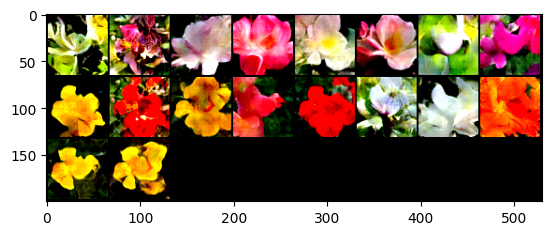

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 20, lossD:0.5606682684489535, lossG:6.82323432663112,lossG_fake:3.411617150584471, lossG_real:3.086240242117817 ,equality:0.3253769084666538


evaluate:108.4485092163086,kid_mean:0.07222629338502884, kid_std:0.04093681648373604,kid_:(tensor(0.0722), tensor(0.0409))


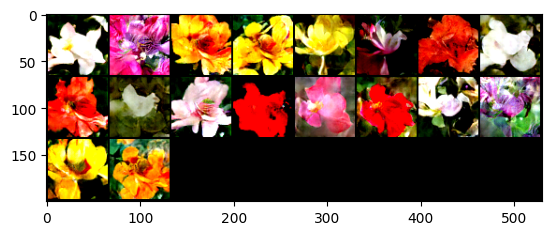

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 21, lossD:0.5084737467859844, lossG:6.707057895012272,lossG_fake:3.3535289631306546, lossG_real:3.0675673468888385 ,equality:0.28596161624181615


evaluate:108.4832763671875,kid_mean:0.08096659928560257, kid_std:0.0525483563542366,kid_:(tensor(0.0810), tensor(0.0525))


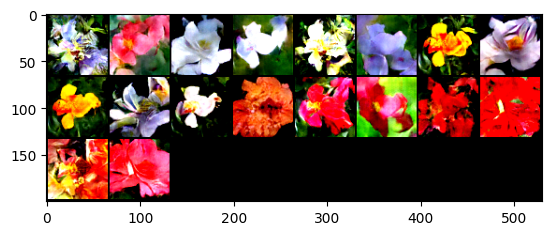

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 22, lossD:0.5343613124551992, lossG:6.615861901959169,lossG_fake:3.3079309599492155, lossG_real:3.086188167912289 ,equality:0.2217427920369266


evaluate:108.5390853881836,kid_mean:0.07462633401155472, kid_std:0.03827447071671486,kid_:(tensor(0.0746), tensor(0.0383))


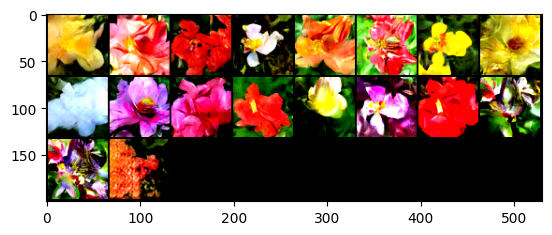

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 23, lossD:0.5444420450683503, lossG:6.510974434972967,lossG_fake:3.2554872212479418, lossG_real:3.099240952035756 ,equality:0.15624626921218576


evaluate:108.88529205322266,kid_mean:0.07291362434625626, kid_std:0.038517504930496216,kid_:(tensor(0.0729), tensor(0.0385))


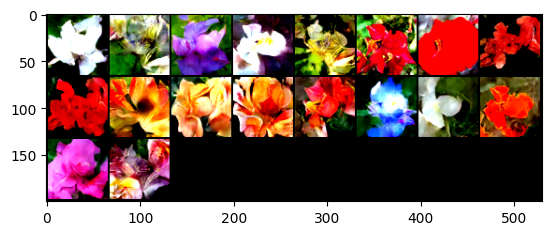

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 24, lossD:0.5058321864570229, lossG:6.644769613025258,lossG_fake:3.3223848101294156, lossG_real:3.1524203176637298 ,equality:0.1699644924656858


evaluate:109.52708435058594,kid_mean:0.07347385585308075, kid_std:0.03495766967535019,kid_:(tensor(0.0735), tensor(0.0350))


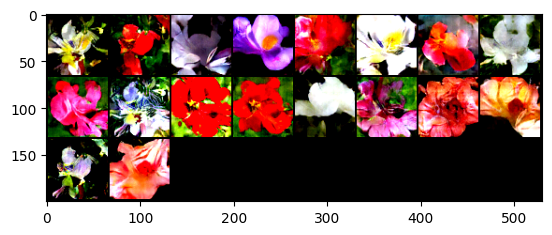

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 25, lossD:0.5122217463636861, lossG:6.741688804719055,lossG_fake:3.370844412775873, lossG_real:3.1744732671571008 ,equality:0.19637114561877222


evaluate:109.54586791992188,kid_mean:0.07438747584819794, kid_std:0.040815409272909164,kid_:(tensor(0.0744), tensor(0.0408))


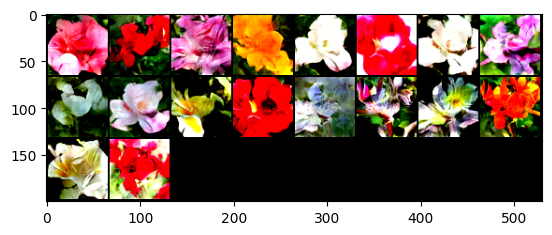

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 26, lossD:0.529787267983249, lossG:6.78022746669436,lossG_fake:3.3901137295857215, lossG_real:3.18499342214714 ,equality:0.20512030743858167


evaluate:109.32827758789062,kid_mean:0.07467436790466309, kid_std:0.04473472014069557,kid_:(tensor(0.0747), tensor(0.0447))


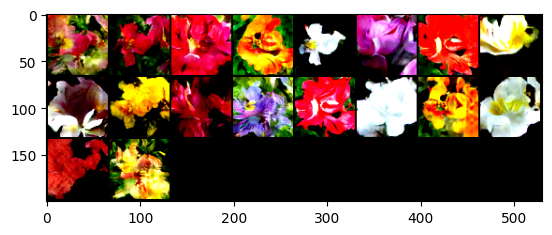

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 27, lossD:0.4682516864754115, lossG:6.865674555880352,lossG_fake:3.4328372631836865, lossG_real:3.2680997865871317 ,equality:0.1647374765965548


evaluate:109.13123321533203,kid_mean:0.06742001324892044, kid_std:0.03889739140868187,kid_:(tensor(0.0674), tensor(0.0389))


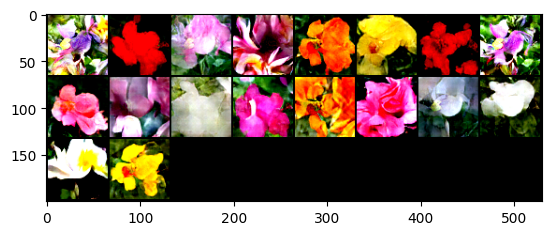

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 28, lossD:0.39800960160972715, lossG:6.8203671464642275,lossG_fake:3.4101835639731397, lossG_real:3.1338666130616826 ,equality:0.27631695091145714


evaluate:109.41928100585938,kid_mean:0.07548648118972778, kid_std:0.04271281510591507,kid_:(tensor(0.0755), tensor(0.0427))


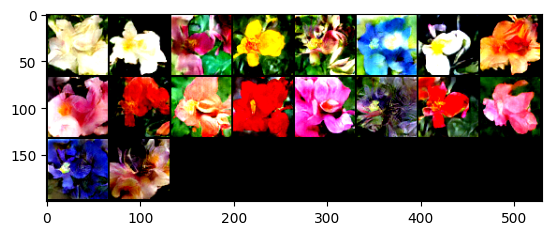

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 29, lossD:0.522445664713973, lossG:6.862651079603769,lossG_fake:3.4313255386445127, lossG_real:3.228635086017905 ,equality:0.2026904526266078


evaluate:109.4979248046875,kid_mean:0.07464143633842468, kid_std:0.038147956132888794,kid_:(tensor(0.0746), tensor(0.0381))


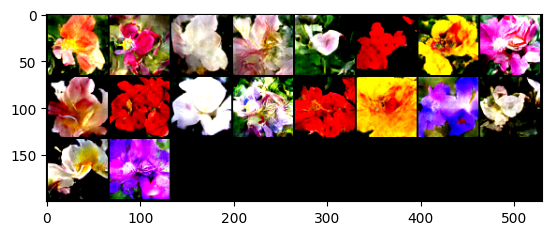

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 30, lossD:0.46743747599205926, lossG:7.109045549503808,lossG_fake:3.5545227552935916, lossG_real:3.248929058753171 ,equality:0.30559369654042046


evaluate:109.73123168945312,kid_mean:0.07463283836841583, kid_std:0.03985785320401192,kid_:(tensor(0.0746), tensor(0.0399))


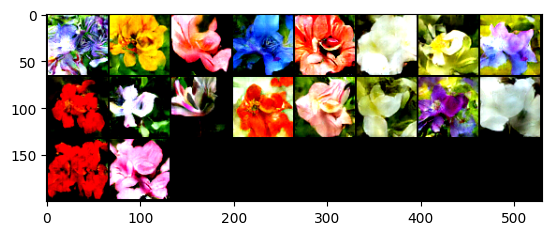

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 31, lossD:0.461702750769706, lossG:6.893025500103108,lossG_fake:3.4465127562000912, lossG_real:3.3218789372629334 ,equality:0.12463381893715786


evaluate:109.99090576171875,kid_mean:0.07432514429092407, kid_std:0.04291601851582527,kid_:(tensor(0.0743), tensor(0.0429))


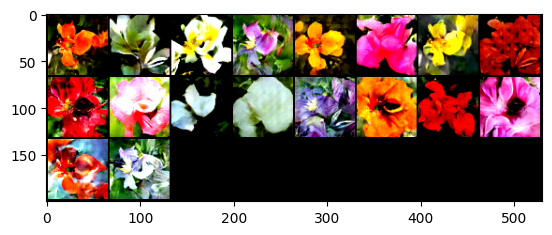

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 32, lossD:0.4762725821397837, lossG:6.903126290700968,lossG_fake:3.4515631305939944, lossG_real:3.230039832661453 ,equality:0.22152329793254166


evaluate:109.9604721069336,kid_mean:0.07564656436443329, kid_std:0.03671104460954666,kid_:(tensor(0.0756), tensor(0.0367))


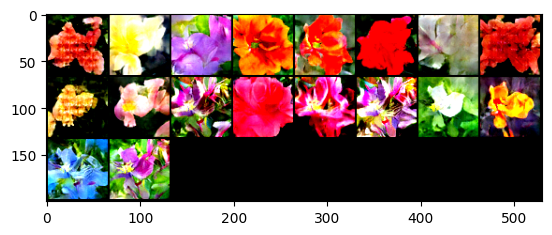

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 33, lossD:0.4248579067169029, lossG:7.259351795159497,lossG_fake:3.6296758888813767, lossG_real:3.3239601436749244 ,equality:0.3057157452064523


evaluate:110.39960479736328,kid_mean:0.07847660779953003, kid_std:0.045892927795648575,kid_:(tensor(0.0785), tensor(0.0459))


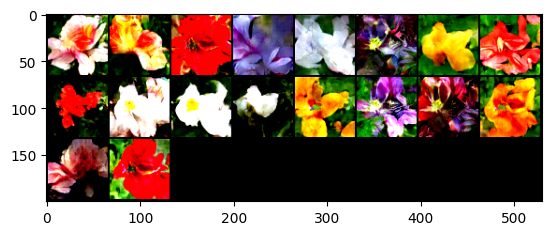

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 34, lossD:0.4086932838957721, lossG:7.062974459916642,lossG_fake:3.5314872175165752, lossG_real:3.2022583857902047 ,equality:0.3292288317263705


evaluate:110.89434814453125,kid_mean:0.07463002949953079, kid_std:0.04531600698828697,kid_:(tensor(0.0746), tensor(0.0453))


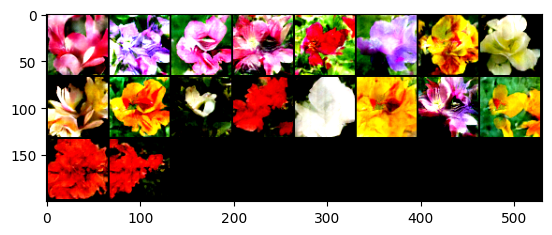

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 35, lossD:0.4373101782306884, lossG:7.360966527346268,lossG_fake:3.6804832665665637, lossG_real:3.4244156991972505 ,equality:0.25606756736931313


evaluate:111.03315734863281,kid_mean:0.07180756330490112, kid_std:0.03827209770679474,kid_:(tensor(0.0718), tensor(0.0383))


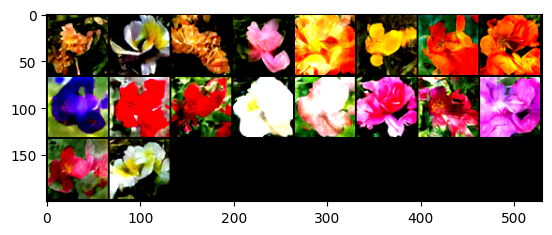

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 36, lossD:0.4455071521981719, lossG:7.151043336368302,lossG_fake:3.57552165429569, lossG_real:3.3394601518668017 ,equality:0.23606150242888813


evaluate:110.88902282714844,kid_mean:0.07644697278738022, kid_std:0.041288770735263824,kid_:(tensor(0.0764), tensor(0.0413))


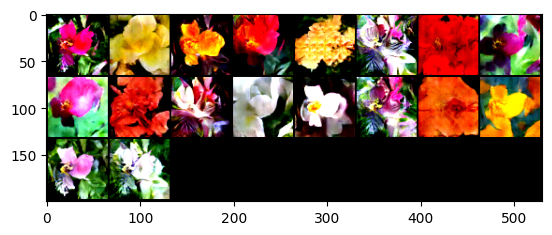

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 37, lossD:0.3786529863741502, lossG:7.2208525231741,lossG_fake:3.6104262471199036, lossG_real:3.295434642185285 ,equality:0.3149916049346184


evaluate:111.08551788330078,kid_mean:0.07425892353057861, kid_std:0.04079325124621391,kid_:(tensor(0.0743), tensor(0.0408))


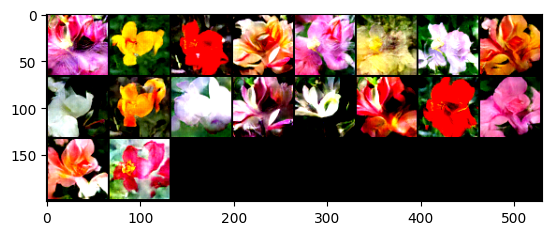

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 38, lossD:0.40687132350087746, lossG:7.266115417758238,lossG_fake:3.6330577065643754, lossG_real:3.3696094033787554 ,equality:0.26344830318562007


evaluate:111.02688598632812,kid_mean:0.07280758768320084, kid_std:0.043851982802152634,kid_:(tensor(0.0728), tensor(0.0439))


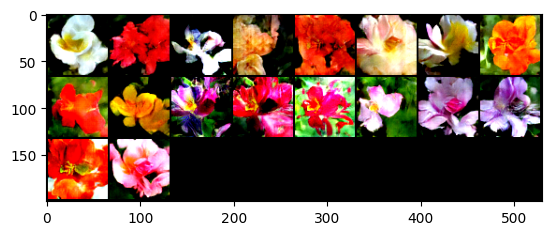

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 39, lossD:0.4030626589088764, lossG:7.201001104799289,lossG_fake:3.60050053619644, lossG_real:3.3093685779756714 ,equality:0.29113195822076854


evaluate:110.67401123046875,kid_mean:0.07112570106983185, kid_std:0.042797598987817764,kid_:(tensor(0.0711), tensor(0.0428))


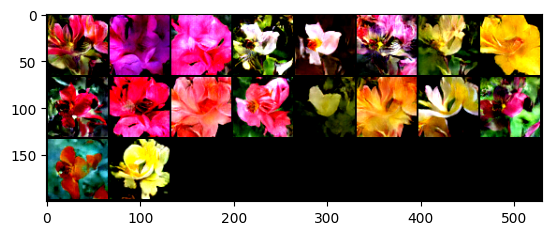

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 40, lossD:0.4333116859378456, lossG:7.198324384041203,lossG_fake:3.5991621917312586, lossG_real:3.4044003561139107 ,equality:0.19476183561734794


evaluate:111.42643737792969,kid_mean:0.07412564009428024, kid_std:0.039861712604761124,kid_:(tensor(0.0741), tensor(0.0399))


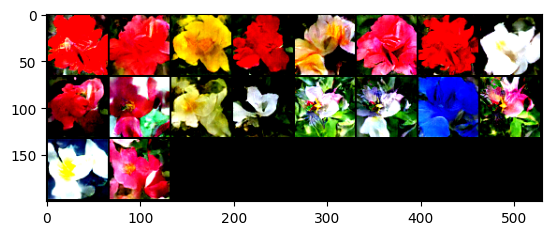

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 41, lossD:0.3469124526346048, lossG:7.186903282276635,lossG_fake:3.593451639980946, lossG_real:3.3811342625074015 ,equality:0.2123173774735445


evaluate:111.47962188720703,kid_mean:0.07601377367973328, kid_std:0.0454392246901989,kid_:(tensor(0.0760), tensor(0.0454))


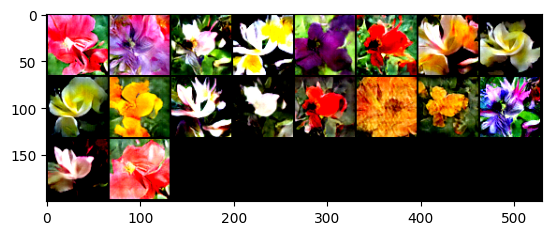

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 42, lossD:0.30159464959977467, lossG:7.212031593600523,lossG_fake:3.6060157928217964, lossG_real:3.4248175395345224 ,equality:0.181198253287274


evaluate:111.42466735839844,kid_mean:0.07424744218587875, kid_std:0.04102315753698349,kid_:(tensor(0.0742), tensor(0.0410))


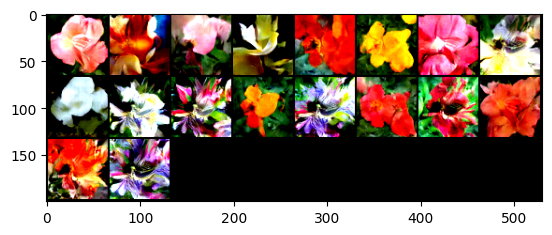

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 43, lossD:0.4285577454161152, lossG:7.169677590860904,lossG_fake:3.5848387919583367, lossG_real:3.3527846463675637 ,equality:0.23205414559077298


evaluate:111.32046508789062,kid_mean:0.08165737241506577, kid_std:0.042892936617136,kid_:(tensor(0.0817), tensor(0.0429))


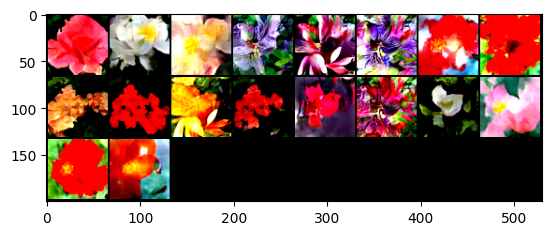

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 44, lossD:0.32802942427761345, lossG:7.125145456165943,lossG_fake:3.5625727439968333, lossG_real:3.4047658903506197 ,equality:0.1578068536462136


evaluate:111.6102294921875,kid_mean:0.06981644034385681, kid_std:0.03557103872299194,kid_:(tensor(0.0698), tensor(0.0356))


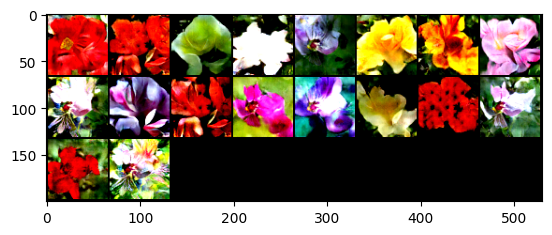

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 45, lossD:0.3290300815212495, lossG:7.196289981453164,lossG_fake:3.598144986097095, lossG_real:3.3431134281806574 ,equality:0.2550315579164377


evaluate:111.29088592529297,kid_mean:0.0690293237566948, kid_std:0.04209941253066063,kid_:(tensor(0.0690), tensor(0.0421))


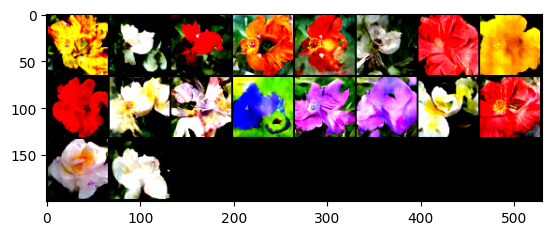

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 46, lossD:0.4509714269938255, lossG:7.286360951303278,lossG_fake:3.643180478979083, lossG_real:3.376497178980448 ,equality:0.26668329999863527


evaluate:111.06538391113281,kid_mean:0.07303748279809952, kid_std:0.04048432037234306,kid_:(tensor(0.0730), tensor(0.0405))


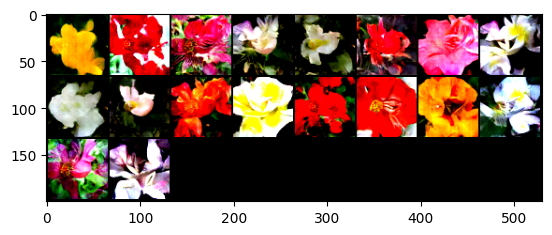

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 47, lossD:0.32772543187958453, lossG:7.330536712720556,lossG_fake:3.665268344786561, lossG_real:3.3483663610752346 ,equality:0.3169019837113263


evaluate:111.61239624023438,kid_mean:0.08010038733482361, kid_std:0.04395400360226631,kid_:(tensor(0.0801), tensor(0.0440))


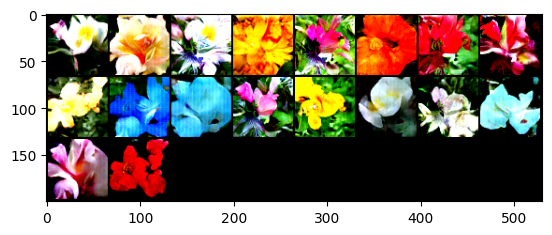

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 48, lossD:1.1217537458298854, lossG:6.8534689898629795,lossG_fake:3.4267345001396623, lossG_real:3.150566474326606 ,equality:0.27616802581305633


evaluate:111.7047348022461,kid_mean:0.08662330359220505, kid_std:0.045125655829906464,kid_:(tensor(0.0866), tensor(0.0451))


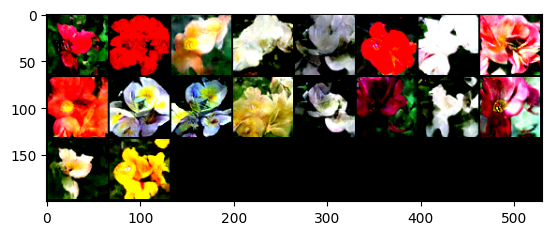

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 49, lossD:0.3832623646278115, lossG:7.072159954645102,lossG_fake:3.536079961481025, lossG_real:3.397954234220449 ,equality:0.13812572726057581


evaluate:111.65744018554688,kid_mean:0.07077173888683319, kid_std:0.03917449340224266,kid_:(tensor(0.0708), tensor(0.0392))


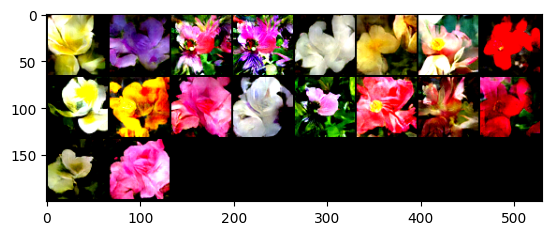

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 50, lossD:0.39475476565020323, lossG:7.398169640198494,lossG_fake:3.6990848235713627, lossG_real:3.3231567396122275 ,equality:0.37592808395913524


evaluate:112.01365661621094,kid_mean:0.07446089386940002, kid_std:0.04126042127609253,kid_:(tensor(0.0745), tensor(0.0413))


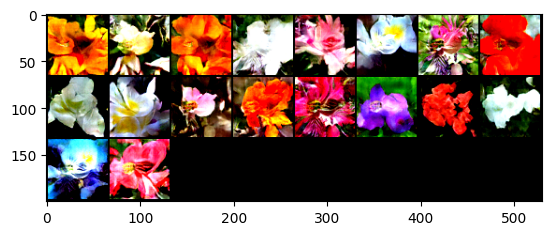

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 51, lossD:0.41380572975703594, lossG:7.0108154375576275,lossG_fake:3.505407719068157, lossG_real:3.3908413605203904 ,equality:0.11456635854776653


evaluate:111.85567474365234,kid_mean:0.08481696248054504, kid_std:0.04024558141827583,kid_:(tensor(0.0848), tensor(0.0402))


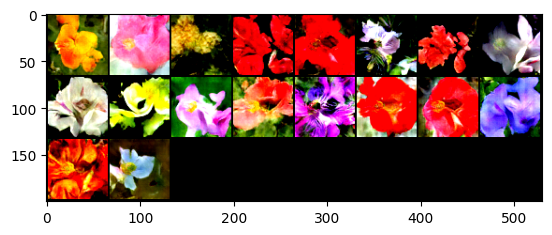

100%|██████████| 103/103 [00:33<00:00,  3.10it/s]


epoch: 52, lossD:0.27551477016356674, lossG:6.821451168615841,lossG_fake:3.4107255869120072, lossG_real:3.333918494506947 ,equality:0.07680709240506012


evaluate:111.46622467041016,kid_mean:0.07227321714162827, kid_std:0.03432381525635719,kid_:(tensor(0.0723), tensor(0.0343))


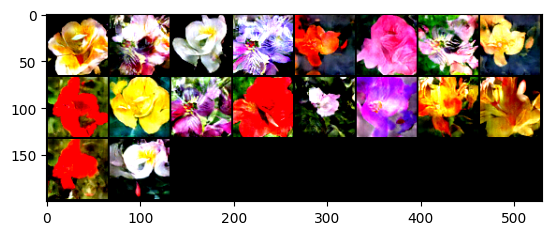

100%|██████████| 103/103 [00:33<00:00,  3.10it/s]


epoch: 53, lossD:0.3970849830069516, lossG:7.196360405208995,lossG_fake:3.598180213382522, lossG_real:3.429325143110405 ,equality:0.1688550702721172


evaluate:112.02880859375,kid_mean:0.08209314942359924, kid_std:0.03981417790055275,kid_:(tensor(0.0821), tensor(0.0398))


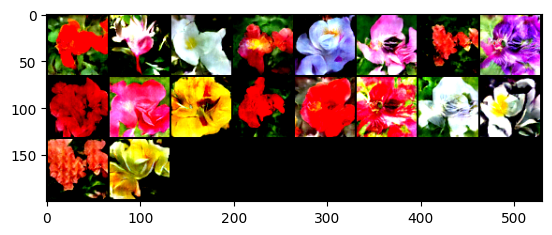

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 54, lossD:0.33240886763172245, lossG:7.408784759854807,lossG_fake:3.704392363724199, lossG_real:3.433358572929808 ,equality:0.27103379079439094


evaluate:112.21609497070312,kid_mean:0.07637371867895126, kid_std:0.03625335171818733,kid_:(tensor(0.0764), tensor(0.0363))


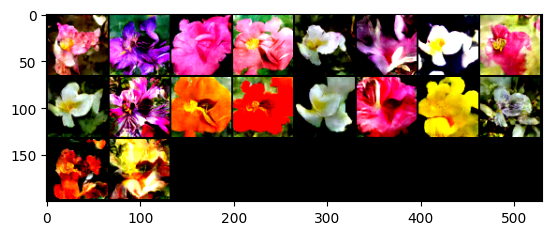

100%|██████████| 103/103 [00:33<00:00,  3.10it/s]


epoch: 55, lossD:0.30768166091835614, lossG:7.376170498653523,lossG_fake:3.688085255692306, lossG_real:3.508364441940217 ,equality:0.17972081375208893


evaluate:111.92796325683594,kid_mean:0.0743008628487587, kid_std:0.03760435804724693,kid_:(tensor(0.0743), tensor(0.0376))


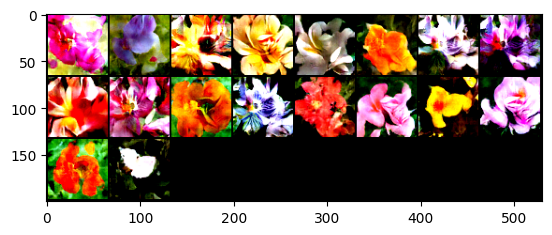

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 56, lossD:0.31960046602394976, lossG:7.409985185826867,lossG_fake:3.7049926128780957, lossG_real:3.593108330970829 ,equality:0.11188428190726674


evaluate:112.12076568603516,kid_mean:0.07126913219690323, kid_std:0.0408075787127018,kid_:(tensor(0.0713), tensor(0.0408))


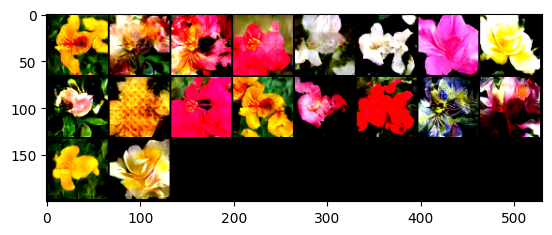

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 57, lossD:0.23959610605775153, lossG:7.319444295272087,lossG_fake:3.6597221638392474, lossG_real:3.565274539213736 ,equality:0.09444762462551148


evaluate:112.44336700439453,kid_mean:0.07624001801013947, kid_std:0.043082013726234436,kid_:(tensor(0.0762), tensor(0.0431))


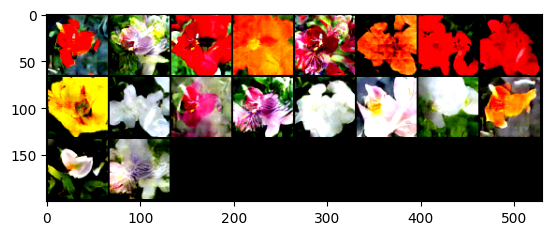

100%|██████████| 103/103 [00:33<00:00,  3.10it/s]


epoch: 58, lossD:0.3445342897157212, lossG:7.189907013791279,lossG_fake:3.5949535071849823, lossG_real:3.4597764449212156 ,equality:0.1351770622637667


evaluate:112.2028579711914,kid_mean:0.07535054534673691, kid_std:0.041204288601875305,kid_:(tensor(0.0754), tensor(0.0412))


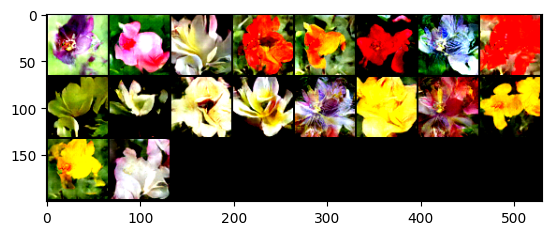

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 59, lossD:0.36364949939917157, lossG:7.22779253154125,lossG_fake:3.6138962660599683, lossG_real:3.3404345872260413 ,equality:0.273461678833927


evaluate:112.0381088256836,kid_mean:0.08431489765644073, kid_std:0.044869109988212585,kid_:(tensor(0.0843), tensor(0.0449))


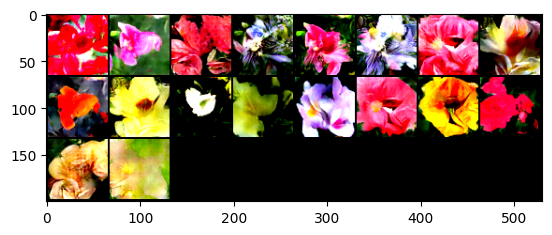

100%|██████████| 103/103 [00:33<00:00,  3.10it/s]


epoch: 60, lossD:0.27721475750135566, lossG:7.203083260545453,lossG_fake:3.601541614069522, lossG_real:3.4526070327434724 ,equality:0.14893458132604964


evaluate:112.4916763305664,kid_mean:0.07602419704198837, kid_std:0.03880494087934494,kid_:(tensor(0.0760), tensor(0.0388))


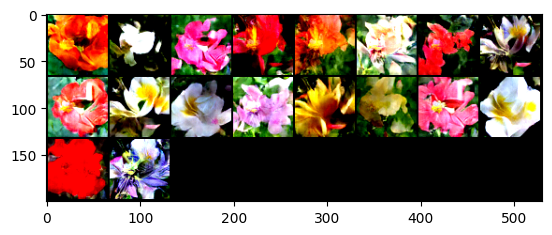

100%|██████████| 103/103 [00:33<00:00,  3.10it/s]


epoch: 61, lossD:0.3294800285032941, lossG:7.47855438537968,lossG_fake:3.739277221262455, lossG_real:3.665812683336943 ,equality:0.07346453792551211


evaluate:112.29207611083984,kid_mean:0.07462241500616074, kid_std:0.040681179612874985,kid_:(tensor(0.0746), tensor(0.0407))


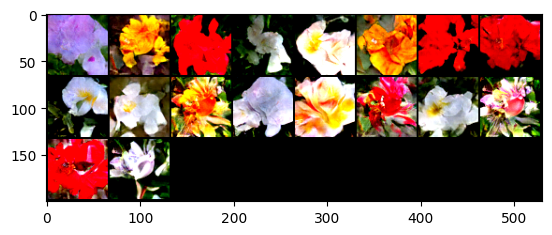

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 62, lossD:0.3403578487346943, lossG:7.33533606482941,lossG_fake:3.6676680257598173, lossG_real:3.4534178905876227 ,equality:0.2142501351721946


evaluate:112.51229095458984,kid_mean:0.0832318365573883, kid_std:0.04349719360470772,kid_:(tensor(0.0832), tensor(0.0435))


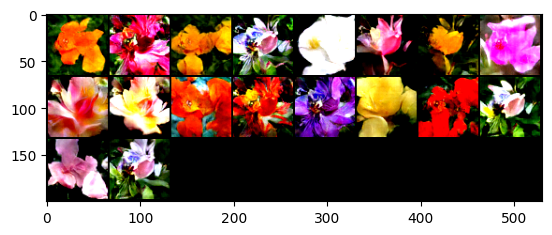

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 63, lossD:0.3447648249091852, lossG:7.4187943588182765,lossG_fake:3.7093972061733598, lossG_real:3.5482380042955715 ,equality:0.16115920187778832


evaluate:112.36284637451172,kid_mean:0.07990506291389465, kid_std:0.04942583292722702,kid_:(tensor(0.0799), tensor(0.0494))


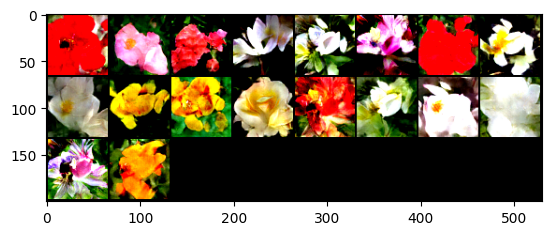

100%|██████████| 103/103 [00:33<00:00,  3.10it/s]


epoch: 64, lossD:0.2860554268411858, lossG:7.409520021920065,lossG_fake:3.7047600294779803, lossG_real:3.584084428051143 ,equality:0.12067560142683753


evaluate:112.11849975585938,kid_mean:0.07138025015592575, kid_std:0.04073667898774147,kid_:(tensor(0.0714), tensor(0.0407))


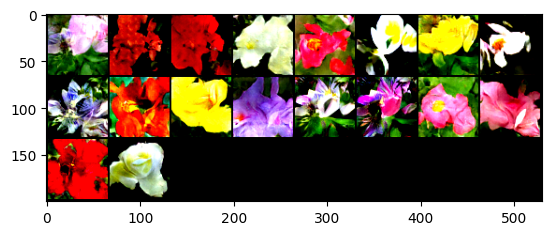

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 65, lossD:0.33153114062440087, lossG:7.6989067572991825,lossG_fake:3.8494533508726696, lossG_real:3.7073438427980663 ,equality:0.14210950807460332


evaluate:112.28164672851562,kid_mean:0.07145616412162781, kid_std:0.03729505464434624,kid_:(tensor(0.0715), tensor(0.0373))


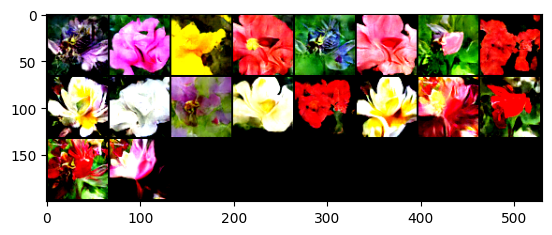

100%|██████████| 103/103 [00:33<00:00,  3.08it/s]


epoch: 66, lossD:0.3317001818191007, lossG:7.667890923694499,lossG_fake:3.8339454612685637, lossG_real:3.4721875164694 ,equality:0.3617579447991637


evaluate:112.44692993164062,kid_mean:0.07402994483709335, kid_std:0.04124092310667038,kid_:(tensor(0.0740), tensor(0.0412))


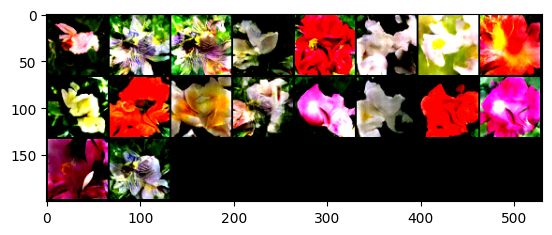

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 67, lossD:0.387867280874329, lossG:7.556017086343858,lossG_fake:3.7780085443293006, lossG_real:3.507813319708537 ,equality:0.2701952246207635


evaluate:112.0015640258789,kid_mean:0.07958206534385681, kid_std:0.03822514787316322,kid_:(tensor(0.0796), tensor(0.0382))


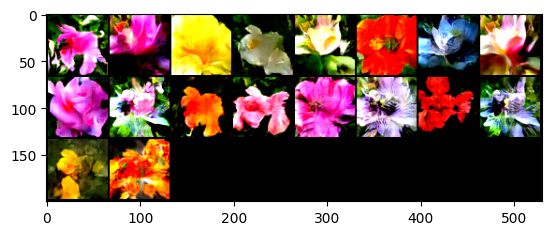

100%|██████████| 103/103 [00:33<00:00,  3.08it/s]


epoch: 68, lossD:0.309397357039027, lossG:7.592585410886598,lossG_fake:3.796292695605639, lossG_real:3.5974124629520676 ,equality:0.19888023265357146


evaluate:112.34204864501953,kid_mean:0.07113613933324814, kid_std:0.0419950895011425,kid_:(tensor(0.0711), tensor(0.0420))


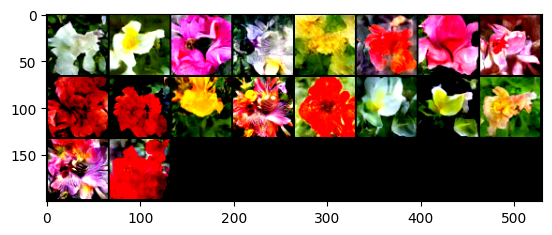

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 69, lossD:0.2758307954255781, lossG:7.255717948802467,lossG_fake:3.6278589654316025, lossG_real:3.480723945839891 ,equality:0.14713501959171138


evaluate:112.45470428466797,kid_mean:0.0699964240193367, kid_std:0.035710327327251434,kid_:(tensor(0.0700), tensor(0.0357))


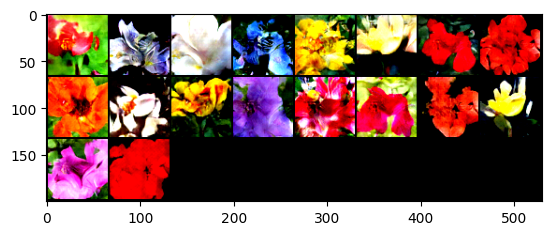

100%|██████████| 103/103 [00:33<00:00,  3.08it/s]


epoch: 70, lossD:0.2361438953005754, lossG:7.441661964342432,lossG_fake:3.720830968282755, lossG_real:3.5093649308947685 ,equality:0.21146603738798664


evaluate:112.55229949951172,kid_mean:0.07890786975622177, kid_std:0.04265344515442848,kid_:(tensor(0.0789), tensor(0.0427))


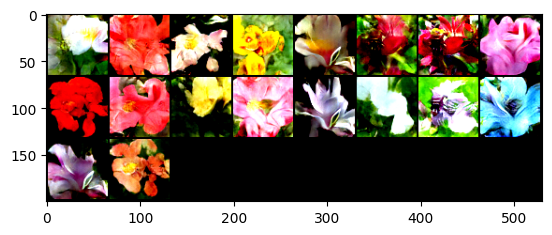

100%|██████████| 103/103 [00:33<00:00,  3.08it/s]


epoch: 71, lossD:0.3692183742295155, lossG:7.746248062374522,lossG_fake:3.8731240294512035, lossG_real:3.614790814883501 ,equality:0.25833321456770264


evaluate:112.24906921386719,kid_mean:0.07695205509662628, kid_std:0.04023045673966408,kid_:(tensor(0.0770), tensor(0.0402))


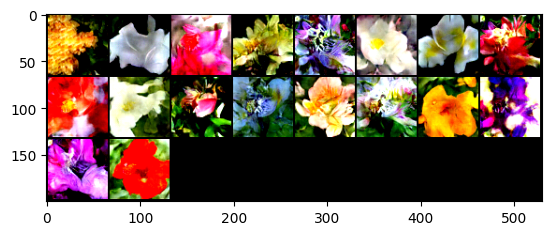

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 72, lossD:0.31339934112694007, lossG:7.349018057573189,lossG_fake:3.674509017212877, lossG_real:3.542228540749226 ,equality:0.13228047646365093


evaluate:112.20919036865234,kid_mean:0.07721016556024551, kid_std:0.04457881674170494,kid_:(tensor(0.0772), tensor(0.0446))


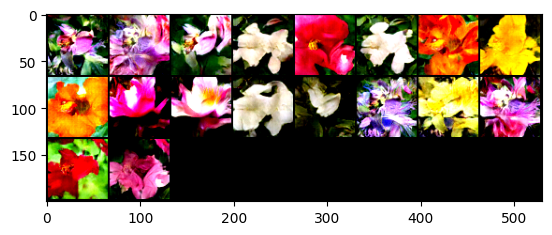

100%|██████████| 103/103 [00:33<00:00,  3.08it/s]


epoch: 73, lossD:0.26592498447393403, lossG:7.602835875113033,lossG_fake:3.8014179599805944, lossG_real:3.5908343496831874 ,equality:0.21058361029740702


evaluate:112.43730926513672,kid_mean:0.07280018925666809, kid_std:0.03326559066772461,kid_:(tensor(0.0728), tensor(0.0333))


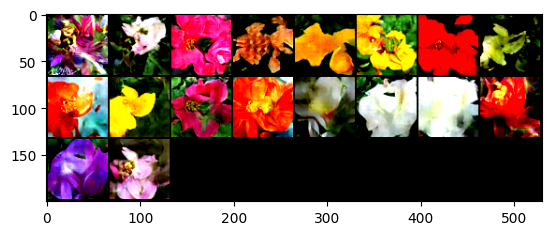

100%|██████████| 103/103 [00:33<00:00,  3.09it/s]


epoch: 74, lossD:0.2743513899746812, lossG:7.859978615658955,lossG_fake:3.929989326926111, lossG_real:3.741833096569024 ,equality:0.18815623035708695


evaluate:112.38801574707031,kid_mean:0.07649792730808258, kid_std:0.04570405185222626,kid_:(tensor(0.0765), tensor(0.0457))


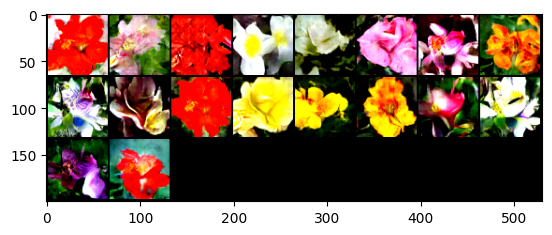

In [56]:
lossesD = []
lossesG = []

raw_lossesD = []
raw_lossesG = []
lossesG_fake = []
lossesG_real = []

equality = 0.0
sum_equality = 0.0
d_equality = []

relu = torch.nn.ReLU()

fid_ = []
kid_mean_ = []
kid_std_ = []
kid_score = []
for epoch in range(opt.n_epoch):
    running_lossD = 0.0 #損失関数初期化
    running_lossG = 0.0
    lossG_fake_running = 0.0
    lossG_real_running = 0.0

    #sum_equality += equality
    equality = 0.0
   # for i , (real_imgs, _) in enumerate(tqdm.tqdm(dataloader, position = 0)):#celebA
    for i , real_imgs in enumerate(tqdm.tqdm(dataloader, position = 0)):#flower
        real_imgs = real_imgs.to(device)
        batch_size = real_imgs.size()[0]
        noise = torch.randn(batch_size, opt.z_dim, 1, 1).to(device)

        #train discriminator

        netD.zero_grad()
        output_real = netD(real_imgs)

        #lossD_real = criterion(output, labels_real)
        lossD_real = torch.mean(relu(1.0 - output_real))


        fake_imgs = netG(noise)##not train  output_fake_d
        output_fake_d = netD(fake_imgs.detach())#not train  output_fake_d

        #lossD_fake = criterion(output, labels_fake)
        lossD_fake = torch.mean(relu(1.0 + output_fake_d))


        lossD = lossD_real + lossD_fake
        #lossD = torch.mean(torch.log(torch.sigmoid(output_real)))- torch.mean(torch.log(torch.sigmoid(output_fake_d)))  #not train  output_fake_d
        lossD.backward()
        optimizerD.step()

        #train generator

        netG.zero_grad()#勾配初期

        output_fake_g = netD(fake_imgs)#train  output_fake_g
        output_real = netD(real_imgs)

        lossG_fake = torch.mean(relu(1.0 - output_fake_g))
        lossG_real = torch.mean(relu(1.0 + output_real))
#original loss function reverse relu for equality
        equality_ = (lossG_fake - lossG_real)
        reverse_loss = reverse_relu(equality_)
        equality_loss = relu(equality_) + reverse_loss

        #lossG =  torch.mean(torch.log(torch.sigmoid(output_fake_g - output_real))) #- torch.mean(torch.log(torch.sigmoid(output_real)))#train  output_fake_g
        lossG =    lossG_real + lossG_fake + equality_loss
        #lossG =    lossG_real + lossG_fake  #original


        lossG.backward()
        optimizerG.step()

        # save loss

        running_lossD += lossD.item()
        running_lossG += lossG.item()

        raw_lossesD.append(lossD.item())
        raw_lossesG.append(lossG.item())

        lossG_fake_running += lossG_fake.item()
        lossG_real_running += lossG_real.item()



    running_lossD /=len(dataloader)
    running_lossG /=len(dataloader)

    lossG_fake_running /= len(dataloader)
    lossG_real_running /= len(dataloader)
#equality
    equality = ( lossG_fake_running - lossG_real_running  )
    d_equality.append(equality)


    print("epoch: {}, lossD:{}, lossG:{},lossG_fake:{}, lossG_real:{} ,equality:{}".format(epoch, running_lossD, running_lossG,lossG_fake_running,lossG_real_running,equality))#-->,lossG_fake:{}, lossG_real:{},lossG_fake_running,lossG_real_running
    lossesD.append(running_lossD)
    lossesG.append(running_lossG)

    lossesG_fake.append(lossG_fake_running)
    lossesG_real.append(lossG_real_running)

     #evaluate GAN
    fake_imgs_1 = fake_imgs.detach()
    real_imgs_1 = real_imgs.to(dtype=torch.uint8).cpu()
    fake_imgs_1 = fake_imgs_1.to(dtype=torch.uint8).cpu()
    fid.update(real_imgs_1, real=True)
    fid.update(fake_imgs_1, real=False)
    eval = fid.compute()

    kid.update(real_imgs_1, real=True)
    kid.update(fake_imgs_1, real=False)
    kid_ = kid.compute()
    kid_mean, kid_std = kid.compute()



    print("evaluate:{},kid_mean:{}, kid_std:{},kid_:{}".format(eval, kid_mean, kid_std, kid_))
    fid_.append(eval)
    kid_mean_.append(kid_mean)
    kid_std_.append(kid_std)
    kid_score.append(kid_)
    #show fake image
    grid_imgs = vutils.make_grid(fake_imgs[:24].detach()+0.5)
    grid_imgs_arr = grid_imgs.cpu().numpy()
    plt.imshow(np.transpose(grid_imgs_arr, (1,2,0)))
    plt.show()

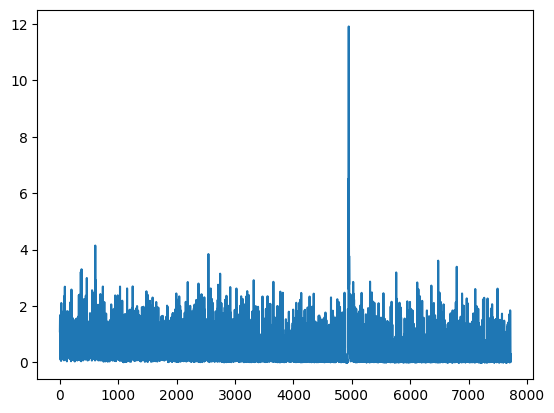

In [57]:
plt.plot(raw_lossesD)

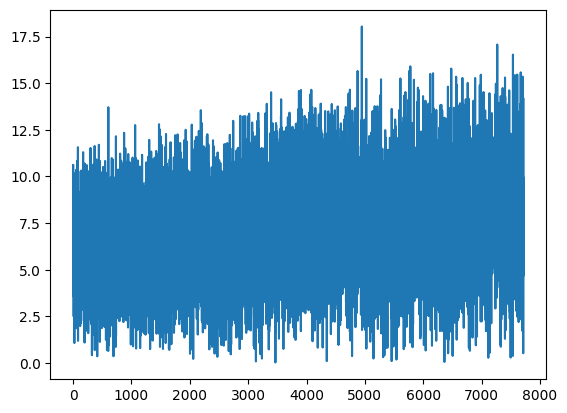

In [58]:
plt.plot(raw_lossesG)

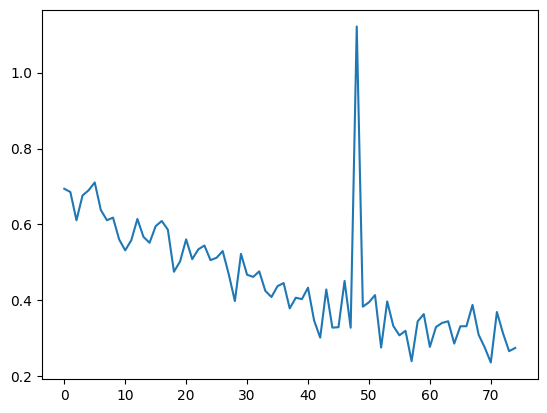

In [59]:
plt.plot(lossesD)

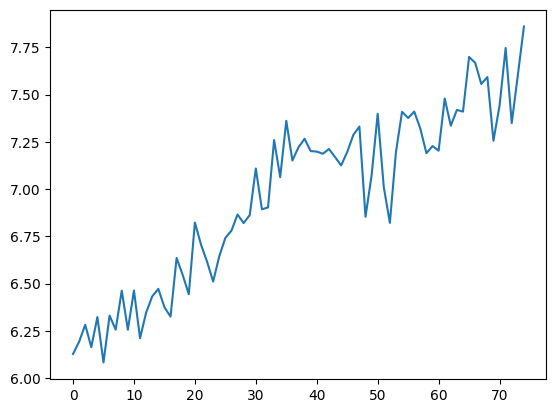

In [60]:
plt.plot(lossesG)

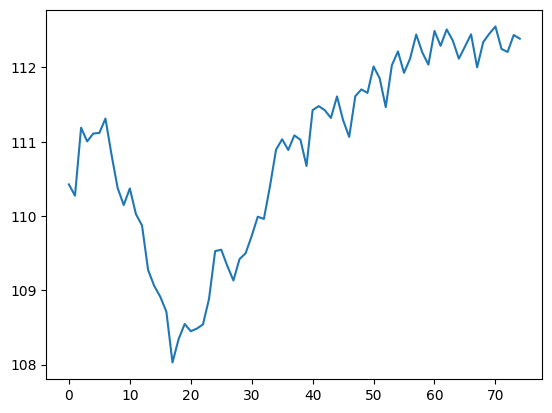

In [61]:
plt.plot(fid_)

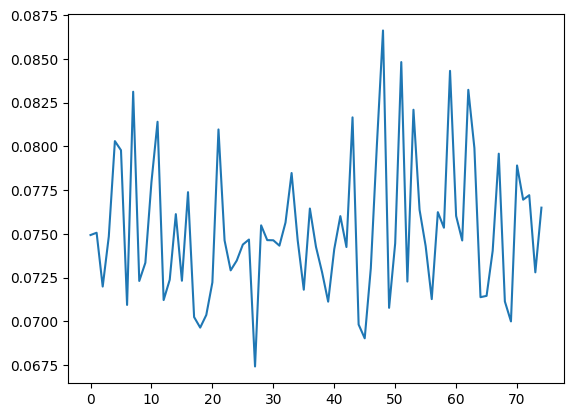

In [62]:
plt.plot(kid_mean_)

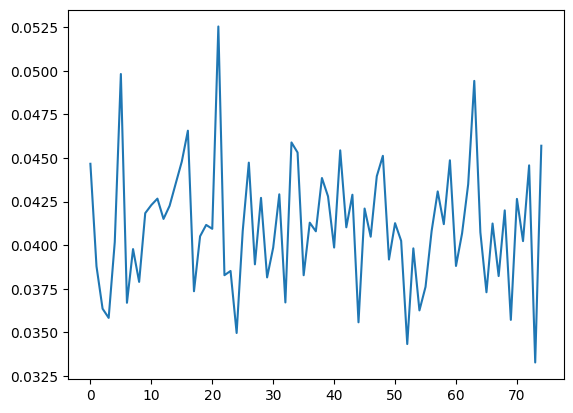

In [63]:
plt.plot(kid_std_)

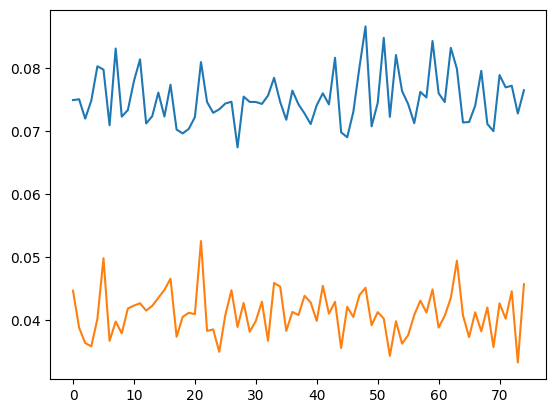

In [64]:
plt.plot(kid_score)

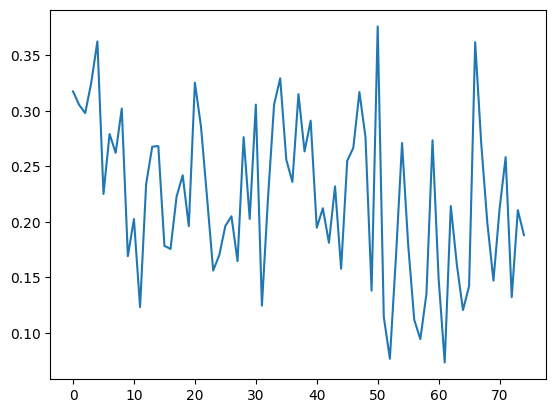

In [65]:
plt.plot(d_equality)

In [66]:

real_imgs = real_imgs.to(dtype=torch.uint8).cpu()
fake_imgs = fake_imgs.to(dtype=torch.uint8).cpu()
fid.update(real_imgs, real=True)
fid.update(fake_imgs, real=False)
fid.compute()

kid.update(real_imgs, real=True)
kid.update(fake_imgs, real=False)
kid.compute()

(tensor(0.0690), tensor(0.0354))